# Preparing Some Necessary Classes for make the code as clean as possible

In [1]:
class Visualizer:
    def __init__(self):
        import matplotlib.pyplot as plt
        import seaborn
        import numpy
        import pandas
        self.pandas = pandas
        self.numpy = numpy
        self.plt = plt
        self.seaborn = seaborn
        
        from autoviz.AutoViz_Class import AutoViz_Class
        %matplotlib inline
        self.auto_viz_object = AutoViz_Class()
        self.visualization_data = None
        
    def perform_explanatory_data_analysis_from_file(self, file_path):
        self.visualization_data = self.auto_viz_object.AutoViz(file_path, verbose=1, max_cols_analyzed = 50)        
    def plot_precision_recall_curve(self, precision, recall):
        fig, ax = self.plt.subplots()
        ax.plot(recall, precision, color='purple')
        ax.set_title('Precision-Recall Curve')
        ax.set_ylabel('Precision')
        ax.set_xlabel('Recall')
        display(self.plt.show())
        
    def plot_confusion_matrix_hard_values(self, confusion_matrix):
        self.plt.figure(figsize = (5,5), dpi=100)
        display(self.seaborn.heatmap(confusion_matrix, annot=True, cmap='Blues'))
        self.plt.show()
    def plot_confusion_matrix_percentages(self, confusion_matrix):
        self.plt.figure(figsize = (5,5), dpi=100)
        display(self.seaborn.heatmap(confusion_matrix/self.numpy.sum(confusion_matrix),
                             annot=True, cmap='Blues', fmt='.2%'))
        self.plt.show()
        
    def plot_correlation_matrix(self, x):
        self.plt.figure(figsize=(16, 16))
        self.seaborn.heatmap(self.pandas.DataFrame(x).corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=0);
        self.plt.show()

In [2]:
class Data_Preprocessor:
    def __init__(self):
        import sklearn, numpy
        self.sklearn = sklearn 
        self.numpy = numpy
        self.label_encoder = None
        self.data_scaler = None
        self.pca_object = None 
    
    def transform_datatype_to_array(self, x):
        return self.numpy.array(x)
    
    def split_x_y_to_train_test(self, x, y, test_ratio = 0.2):
        try:
            return self.sklearn.model_selection.train_test_split(x, y, test_size = test_ratio)
        except:
            raise Exception("error in split_data_to_train_test in Data_Preprocessing class")
            
    def is_label_encoder_initialized(self):
        return self.label_encoder != None
        
    def fit_label_enocder(self, x):
        return self.sklearn.preprocessing.LabelEncoder().fit(x)
        
            
    def encode_labels(self, x):
        if( self.is_label_encoder_initialized() == False):
            self.label_encoder = self.fit_label_enocder(x)
        return self.label_encoder.transform(x)
    
    def is_data_scaler_initialized(self):
        return self.data_scaler != None
    
    def fit_data_scaler(self, x):
        return self.sklearn.preprocessing.MinMaxScaler().fit(x)
    
    def scale_data(self, x):
        if (self.is_data_scaler_initialized() == False):
            self.data_scaler = self.fit_data_scaler(x)
        return self.data_scaler.transform(x)
    
    def drop_dataframe_columns(self, dataframe, list_of_column_names):
        return dataframe.drop(list_of_column_names, axis=1)
    
    def is_pca_initizalied(self):
        return self.pca_object != None
    
    def fit_PCA_object(self, x, n_components = 0.95):
#         from sklearn.decomposition import PCA
        return self.sklearn.decomposition.PCA(n_components=n_components).fit(x)
    
    def reduce_features_using_PCA(self, x, n_components = 0.95):
        if( self.is_pca_initizalied() == False):
            self.pca_object = self.fit_PCA_object(x, n_components = n_components)
        return self.pca_object.transform(x)
    
    def convert_categorical_array_to_sparse_categorical_array(self, y):
        return [list(i).index(max(i)) for i in y]
    def convert_single_valued_bibnary_array_probabilities_to_hard_value(self, y):
        return [round(i) for i in y]
    def convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(sef, y):
        return [1-i for i in y[:,0]]

In [3]:
class Data:
    def __init__(self):
        import pandas
        self.pandas = pandas
        self.data_frame = None
        self.x = None
        self.y = None
        self.x_train = self.x_test = None
        self.y_train = self.y_test = None
        
    def set_dataframe_from_csv(self, path):
        self.data_frame = self.pandas.read_csv(path)

In [4]:
class Model_Evaluater():
    def __init__(self):
        import sklearn
        self.sklearn = sklearn
        
    def evaluate_accuracy(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.accuracy_score(y_true, y_hard_predictions)
    def evaluate_F1_score(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.f1_score(y_true, y_hard_predictions)
    def evaluate_precission_score(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.precision_score(y_true, y_hard_predictions)
    def evaluate_recall_score(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.recall_score(y_true, y_hard_predictions)
    
    def evaluate_precision_recall_threshholds(self, y_true, y_predicted_probabilities):
        '''returns precission, recall and thresh_holds'''
        return self.sklearn.metrics.precision_recall_curve(y_true, y_predicted_probabilities)
    
    def classification_report(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.classification_report(y_true, y_hard_predictions)
    
    def evaluate_binary_confusion_matrix(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.confusion_matrix(y_true, y_hard_predictions)
    
    def evaluate_ROC_AUC_score(self, y_true, y_hard_predictions):
        return self.sklearn.metrics.roc_auc_score(y_true, y_hard_predictions)

In [5]:
visualizer_object = Visualizer()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


# Initial EDA (Exploratory Data Analysis)

In [6]:
league_of_legends_csv_file_path = \
r'E:/Z-Machine Learning/My Work/DataSets/League of Legends/high_diamond_ranked_10min.csv'

Shape of your Data Set loaded: (9879, 40)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
gameId,9879,int64,0,0.000000,100.000000,0,possible ID column: drop
redGoldDiff,6047,int64,0,0.000000,61.210649,0,
blueGoldDiff,6047,int64,0,0.000000,61.210649,0,
redExperienceDiff,5356,int64,0,0.000000,54.216014,0,
blueExperienceDiff,5356,int64,0,0.000000,54.216014,0,
blueTotalGold,4739,int64,0,0.000000,47.970442,0,
blueGoldPerMin,4739,float64,0,0.000000,47.970442,0,
redGoldPerMin,4732,float64,0,0.000000,47.899585,0,
redTotalGold,4732,int64,0,0.000000,47.899585,0,
blueTotalExperience,4143,int64,0,0.000000,41.937443,0,


    40 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['gameId']
   Total columns > 30, too numerous to print.
Number of All Scatter Plots = 21


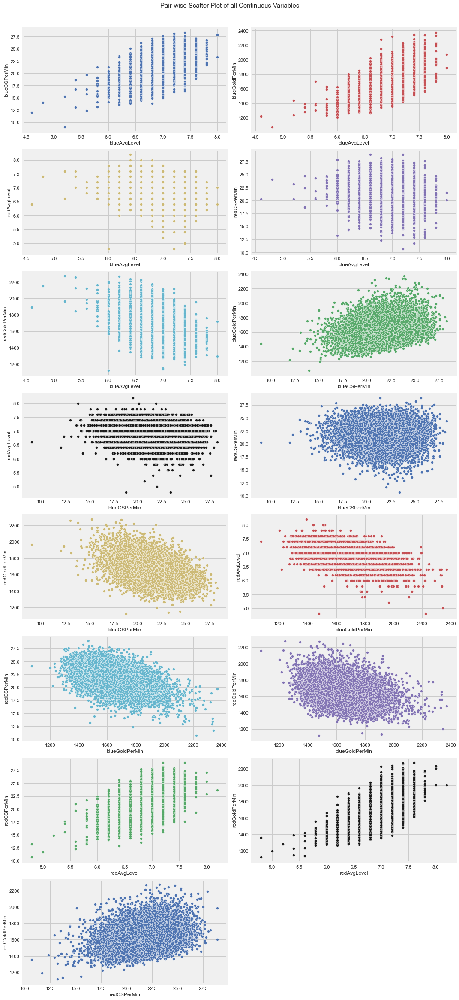

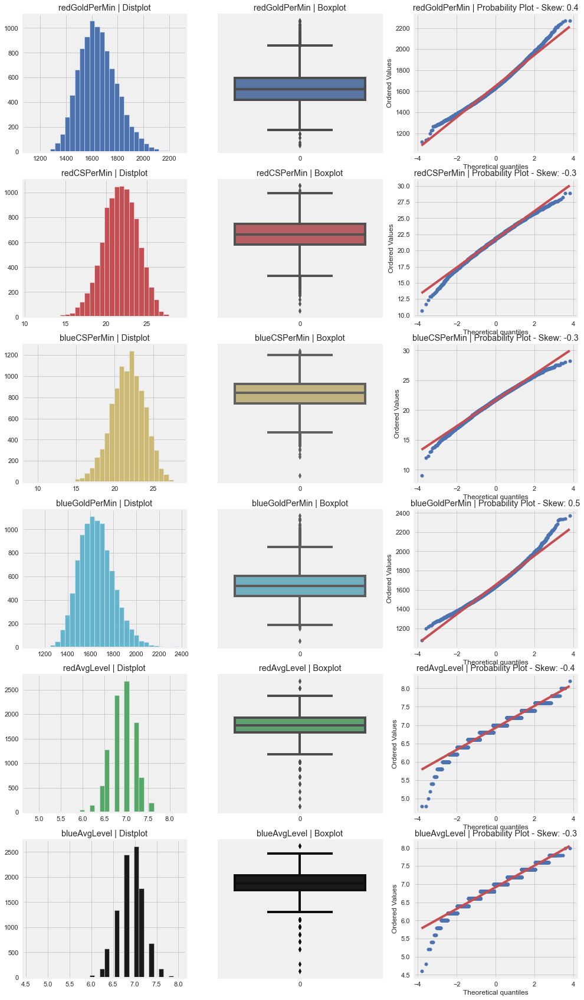

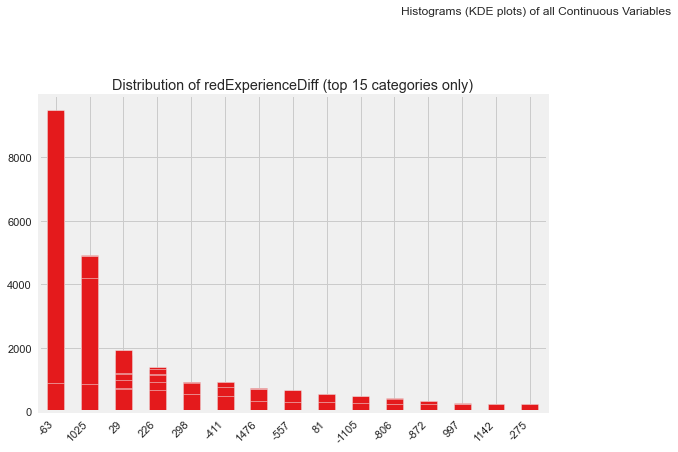

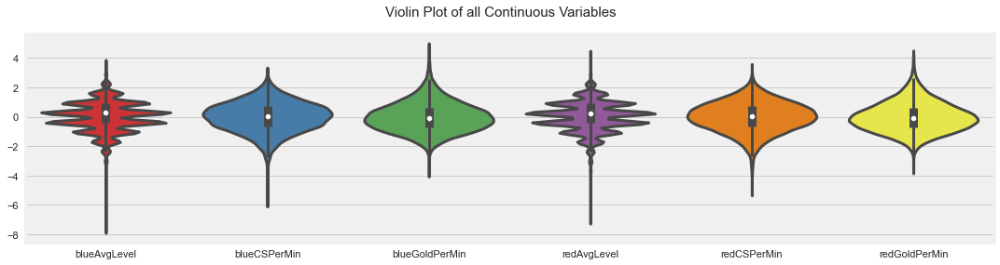

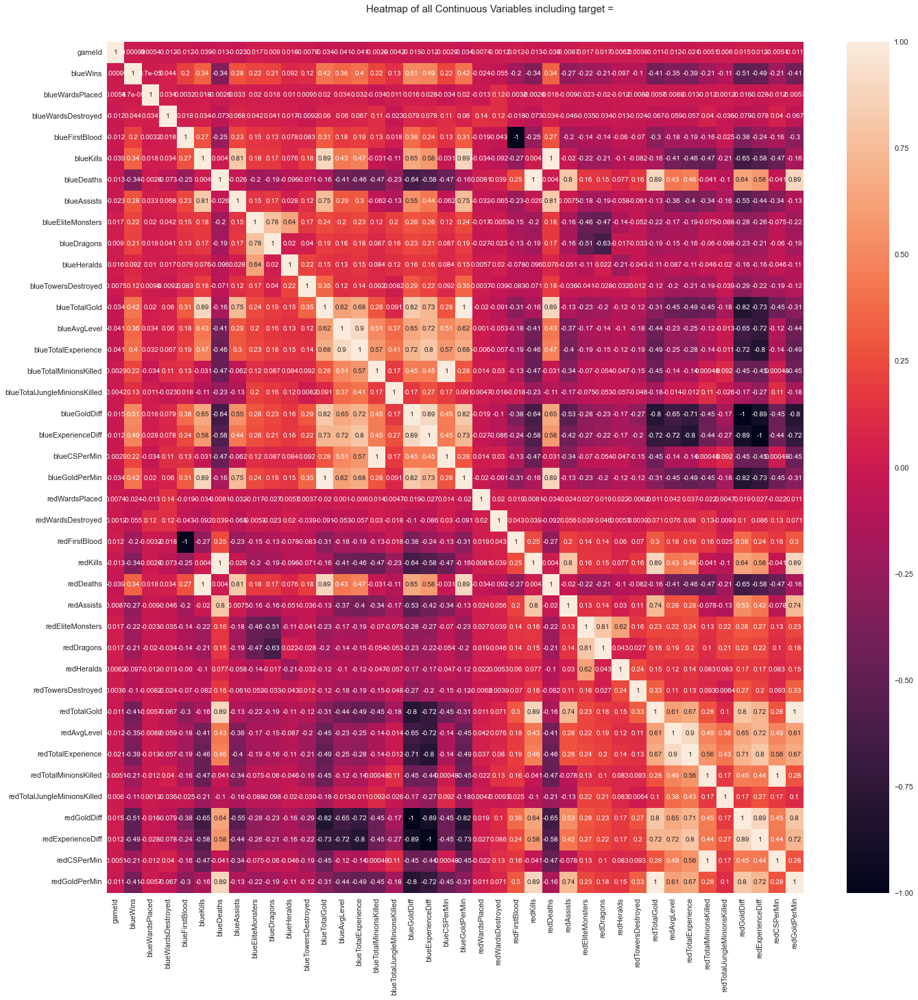

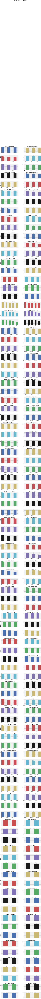

All Plots done
Time to run AutoViz = 46 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [7]:
visualizer_object.perform_explanatory_data_analysis_from_file(league_of_legends_csv_file_path)

In [8]:
data_object = Data()
preprocessing_object = Data_Preprocessor()

In [9]:
data_object.set_dataframe_from_csv(league_of_legends_csv_file_path)
data_object.data_frame.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


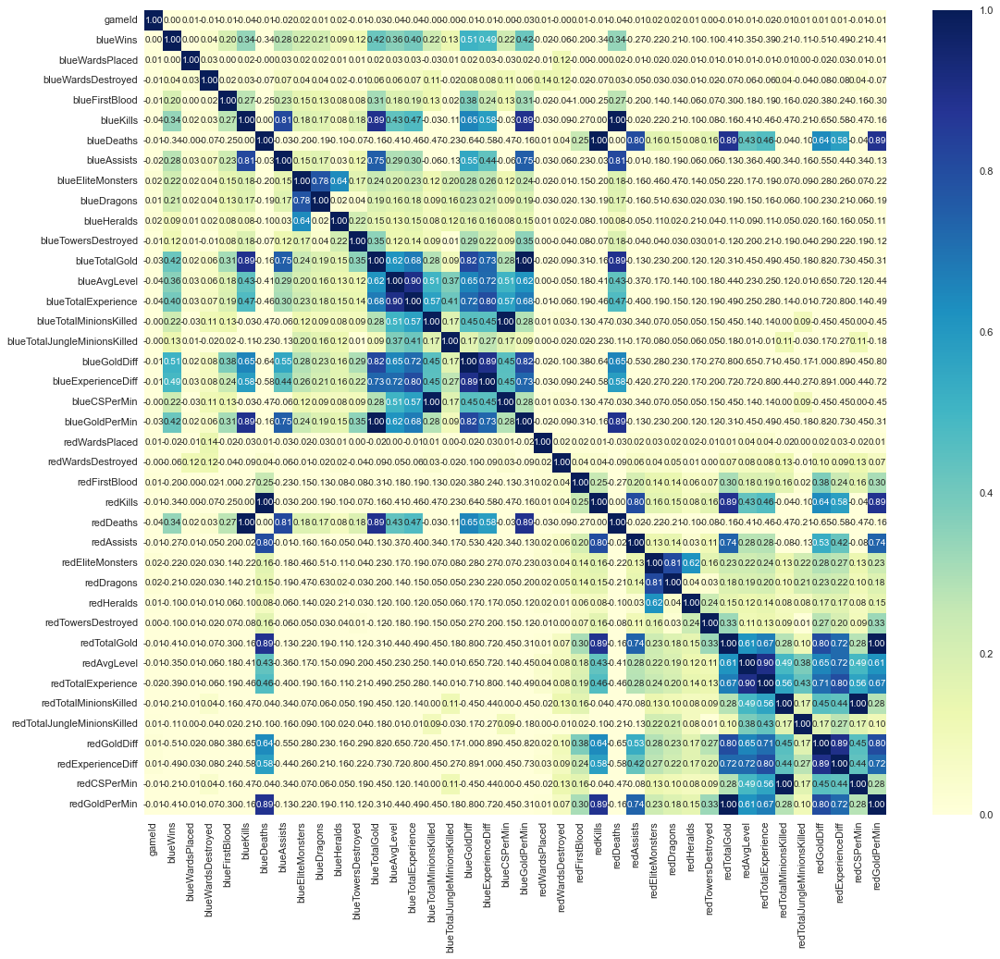

In [10]:
#I simply want to visualize the correlation matrix again as 
visualizer_object.plot_correlation_matrix(data_object.data_frame)

In [11]:
data_object.x = \
            preprocessing_object.drop_dataframe_columns(data_object.data_frame, list_of_column_names=['gameId', 'blueWins'])

data_object.y = data_object.data_frame['blueWins']

data_object.x = preprocessing_object.transform_datatype_to_array(data_object.x)
data_object.y = preprocessing_object.transform_datatype_to_array(data_object.y)


data_object.x_train, data_object.x_test, data_object.y_train, data_object.y_test \
                        = preprocessing_object.split_x_y_to_train_test(data_object.x, data_object.y, test_ratio=0.3)

print(data_object.x_train.shape, data_object.x_test.shape, data_object.y_train.shape, data_object.y_test.shape)

(6915, 38) (2964, 38) (6915,) (2964,)


In [12]:
#in the first call of scale_data the min_max_scaler will fit & transform
#but in the second call it will only transform the data
data_object.x_train = preprocessing_object.scale_data(data_object.x_train)
data_object.x_test = preprocessing_object.scale_data(data_object.x_test)


#in the first call of encode_labels the label_encoder will fit & transform
#but in the second call it will only transform the data
data_object.y_train = preprocessing_object.encode_labels(data_object.y_train)
data_object.y_test = preprocessing_object.encode_labels(data_object.y_test)

# Initial Models Training and Testing

In [13]:
model_evaluation_object = Model_Evaluater()

In [14]:
def garbage_collector():
    import gc
    return gc.collect()
def evalute_model_full_evaluation(y_true, y_hard_predictions, y_soft_predictions):
    model_evaluation_object = Model_Evaluater()
    visualizer_object = Visualizer()
    
    print('Accuracy Score is ', model_evaluation_object.evaluate_accuracy(y_true, y_hard_predictions))
    
    print(' \n \n \n Classification report \n---------')
    print(model_evaluation_object.classification_report(y_true, y_hard_predictions))
    model_precision, model_recall, _ = \
                            model_evaluation_object.evaluate_precision_recall_threshholds(y_true, y_soft_predictions)

    visualizer_object.plot_precision_recall_curve(model_precision, model_recall)
    print('\n\n\n AUC is \n\n #########################################\n\n', '%.4f'%
          model_evaluation_object.evaluate_ROC_AUC_score(y_true, y_hard_predictions),
          '\n\n #########################################\n')
    
    
    model_confusion_matrix = model_evaluation_object.evaluate_binary_confusion_matrix(y_true, y_hard_predictions)
    visualizer_object.plot_confusion_matrix_hard_values(model_confusion_matrix)
    visualizer_object.plot_confusion_matrix_percentages(model_confusion_matrix)
    
    garbage_collector()

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [16]:
logistic_regression = LogisticRegression()
logistic_regression.fit(data_object.x_train, data_object.y_train)
logistic_regression_train_predictions = logistic_regression.predict(data_object.x_train)
logistic_regression_test_predictions = logistic_regression.predict(data_object.x_test)

In [17]:
logistic_regression_test_soft_predictions = logistic_regression.predict_proba(data_object.x_test)
logistic_regression_test_soft_predictions = \
preprocessing_object.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    logistic_regression_test_soft_predictions)

Accuracy Score is  0.7321187584345479
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.73      0.74      0.73      1488
           1       0.73      0.73      0.73      1476

    accuracy                           0.73      2964
   macro avg       0.73      0.73      0.73      2964
weighted avg       0.73      0.73      0.73      2964



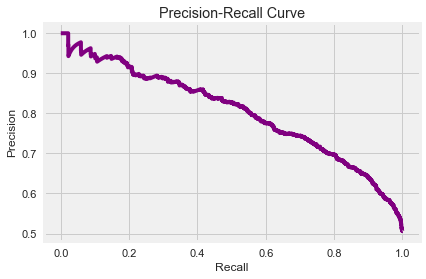

None




 AUC is 

 #########################################

 0.7321 

 #########################################



<AxesSubplot:>

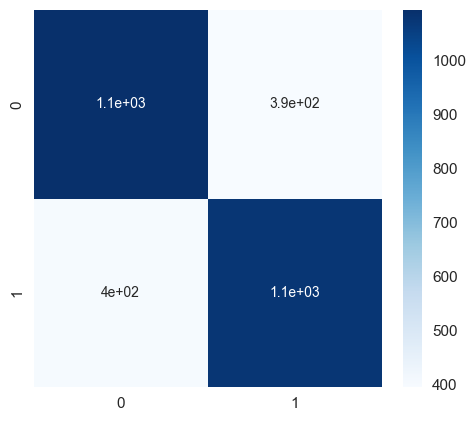

<AxesSubplot:>

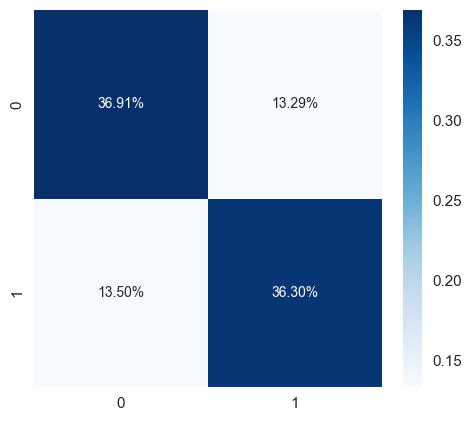

In [18]:
evalute_model_full_evaluation(data_object.y_test, logistic_regression_test_predictions,
                              logistic_regression_test_soft_predictions)

In [19]:
SVM_model = SVC(probability=True)
SVM_model.fit(data_object.x_train, data_object.y_train)
SVM_model_train_predictions = SVM_model.predict(data_object.x_train)
SVM_model_test_predictions = SVM_model.predict(data_object.x_test)

In [20]:
SVM_model_test_soft_predictions = SVM_model.predict_proba(data_object.x_test)
SVM_model_test_soft_predictions = \
preprocessing_object.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    SVM_model_test_soft_predictions)

Accuracy Score is  0.7230094466936572
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.72      0.73      0.73      1488
           1       0.73      0.71      0.72      1476

    accuracy                           0.72      2964
   macro avg       0.72      0.72      0.72      2964
weighted avg       0.72      0.72      0.72      2964



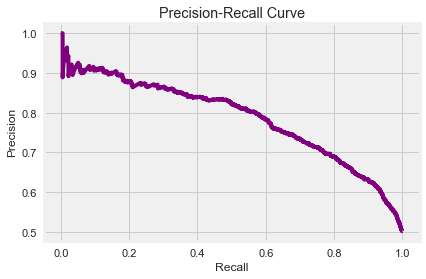

None




 AUC is 

 #########################################

 0.7230 

 #########################################



<AxesSubplot:>

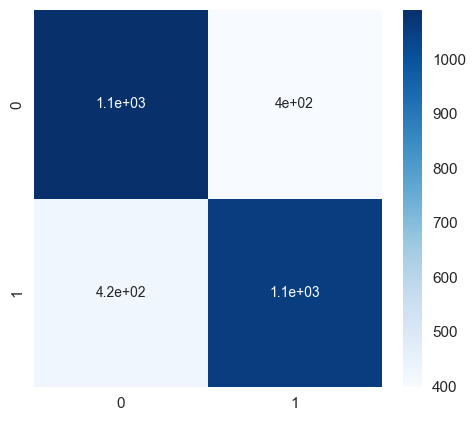

<AxesSubplot:>

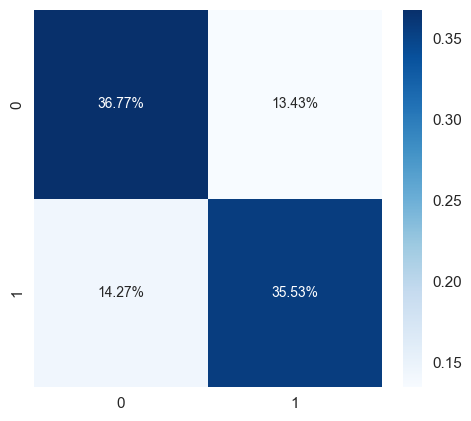

In [21]:
evalute_model_full_evaluation(data_object.y_test, SVM_model_test_predictions,
                              SVM_model_test_soft_predictions)

In [22]:
random_forest_model = RandomForestClassifier(n_estimators = 1_000, max_depth=20, random_state=0)
random_forest_model.fit(data_object.x_train, data_object.y_train)
random_forest_model_train_predictions = random_forest_model.predict(data_object.x_train)
random_forest_model_test_predictions = random_forest_model.predict(data_object.x_test)

In [23]:
random_forest_model_test_soft_predictions = random_forest_model.predict_proba(data_object.x_test)
random_forest_model_test_soft_predictions = \
preprocessing_object.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    random_forest_model_test_soft_predictions)

Accuracy Score is  0.7243589743589743
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.72      0.74      0.73      1488
           1       0.73      0.71      0.72      1476

    accuracy                           0.72      2964
   macro avg       0.72      0.72      0.72      2964
weighted avg       0.72      0.72      0.72      2964



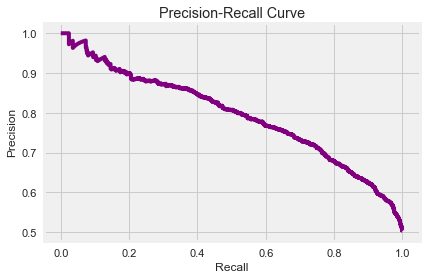

None




 AUC is 

 #########################################

 0.7243 

 #########################################



<AxesSubplot:>

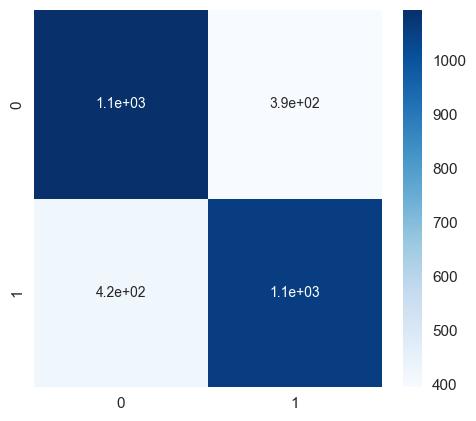

<AxesSubplot:>

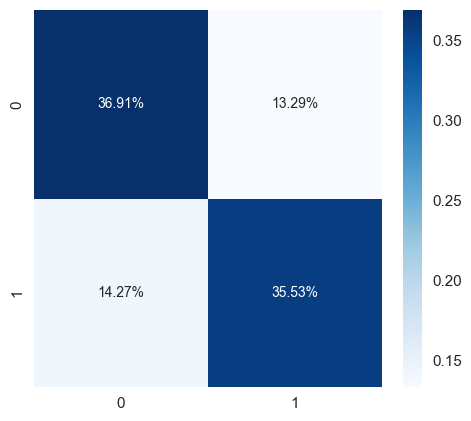

In [24]:
evalute_model_full_evaluation(data_object.y_test, random_forest_model_test_predictions,
                              random_forest_model_test_soft_predictions)

# Seems that the 3 Previous Classifiers are performing well
# We'll Try running a neural network model to see if there's any differences or insights that may be gained

In [25]:
#================================================ 
import tensorflow as tf
class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        keys = list(logs.keys())
        if(float(logs.get('acc')) >= 0.73 and float(logs.get('val_acc')) >= 0.74):
            print('')
            print('')
            print('Training is stopped because ')
            print('the accuracy is ', float(logs.get('acc')) , 'and the val_acc is ', float(logs.get('val_acc')) )
            self.model.stop_training = True

In [26]:
deep_model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(data_object.x_train.shape[1:])),
    tf.keras.layers.Dense(100, activation='relu', kernel_regularizer=tf.keras.regularizers.L1(0.0001)),
    tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.L1(0.0001)),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

deep_model.summary()
deep_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['acc'])  
hist = deep_model.fit(data_object.x_train, data_object.y_train, epochs=100, batch_size=8,
                      validation_data=(data_object.x_test, data_object.y_test), callbacks=[CustomCallback()])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 38)                0         
                                                                 
 dense (Dense)               (None, 100)               3900      
                                                                 
 dense_1 (Dense)             (None, 64)                6464      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 10,429
Trainable params: 10,429
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
865/865 [==============================] - 5s 5ms/step - loss: 0.6211 - acc: 0.7061 - val_loss: 0.5863 - val_acc: 0.7176
Epoch 2/100
865/865 [==============================

865/865 [==============================] - 5s 6ms/step - loss: 0.5335 - acc: 0.7329 - val_loss: 0.5397 - val_acc: 0.7264
Epoch 56/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5331 - acc: 0.7335 - val_loss: 0.5429 - val_acc: 0.7217
Epoch 57/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5336 - acc: 0.7323 - val_loss: 0.5405 - val_acc: 0.7294
Epoch 58/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5333 - acc: 0.7286 - val_loss: 0.5390 - val_acc: 0.7304
Epoch 59/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5328 - acc: 0.7332 - val_loss: 0.5407 - val_acc: 0.7284
Epoch 60/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5335 - acc: 0.7316 - val_loss: 0.5391 - val_acc: 0.7284
Epoch 61/100
865/865 [==============================] - 5s 6ms/step - loss: 0.5329 - acc: 0.7310 - val_loss: 0.5400 - val_acc: 0.7298
Epoch 62/100
865/865 [==============================] - 6s 6ms/step - loss:

In [27]:
deep_model_train_predictions = deep_model.predict(data_object.x_train)[:, 0]
deep_model_hard_train_predictions = \
        preprocessing_object.convert_single_valued_bibnary_array_probabilities_to_hard_value(deep_model_train_predictions)

deep_model_test_predictions = deep_model.predict(data_object.x_test)[:, 0]
deep_model_hard_test_predictions = \
        preprocessing_object.convert_single_valued_bibnary_array_probabilities_to_hard_value(deep_model_test_predictions)

Accuracy Score is  0.728744939271255
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.72      0.76      0.74      1488
           1       0.74      0.70      0.72      1476

    accuracy                           0.73      2964
   macro avg       0.73      0.73      0.73      2964
weighted avg       0.73      0.73      0.73      2964



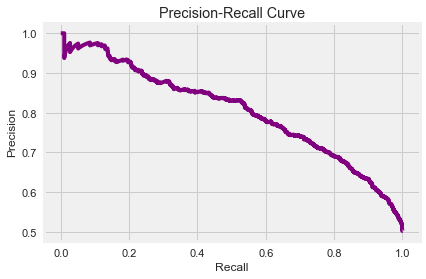

None




 AUC is 

 #########################################

 0.7286 

 #########################################



<AxesSubplot:>

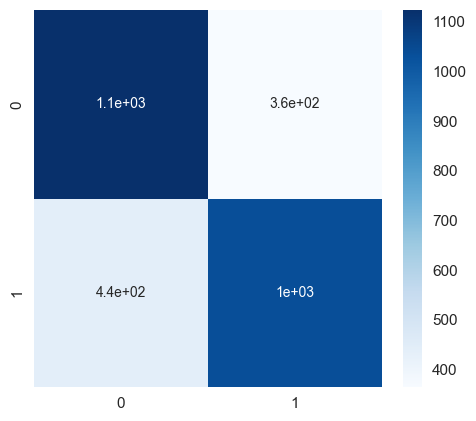

<AxesSubplot:>

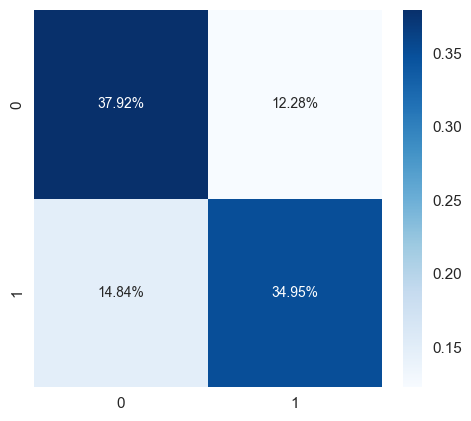

In [28]:
evalute_model_full_evaluation(data_object.y_test, deep_model_hard_test_predictions,
                              deep_model_test_predictions)

From many Trials of this notebook it seems that the neural network can either score as well as a random forst model or it may even score worse than the classical models avilable.

This may be due to that the neural networks can easily overfit this dataset and the limited data avilable that don't even exceed 600 records

# It appears that most models Score very well without performing any feature Selection and Dimensionality Reduction

# Let's check the impact of performing Dimensionality Reduction on the same Models

In [29]:
def copy_data_object(data_object_to_be_copied):
    new_data_object_to_be_returned = Data()
    new_data_object_to_be_returned.pandas = data_object_to_be_copied.pandas
    new_data_object_to_be_returned.data_frame = data_object_to_be_copied.data_frame.copy()
    
    new_data_object_to_be_returned.x = data_object_to_be_copied.x.copy()
    new_data_object_to_be_returned.y = data_object_to_be_copied.y.copy()
    
    new_data_object_to_be_returned.x_train = data_object_to_be_copied.x_train.copy()
    new_data_object_to_be_returned.y_train = data_object_to_be_copied.y_train.copy()
    
    new_data_object_to_be_returned.x_test = data_object_to_be_copied.x_test.copy()
    new_data_object_to_be_returned.y_test = data_object_to_be_copied.y_test.copy()
    
    return new_data_object_to_be_returned

In [30]:
data_object_PCA = copy_data_object(data_object)

In [31]:
def is_correlation_very_high(correlation_value):
    '''check if correlation_value >= 0.95 or <= -0.95'''
    return correlation_value >= 0.95 or correlation_value <= -0.95
def get_data_frame_correlation_suggestions(dataframe):
    dataframe_correlation = dataframe.corr()
    suggestions = []
    for column_name_1 in data_object.data_frame.columns:
        for column_name_2 in data_object.data_frame.columns:
            col_1_and_col_2_correlation = dataframe_correlation[column_name_1][column_name_2]
            
            if(column_name_1 != column_name_2 and is_correlation_very_high(col_1_and_col_2_correlation)):
                suggestions.append( [column_name_1, '%.2f' %col_1_and_col_2_correlation, column_name_2] )
                
    return suggestions

correlation_drop_suggestions = get_data_frame_correlation_suggestions(data_object_PCA.data_frame)
correlation_drop_suggestions

[['blueFirstBlood', '-1.00', 'redFirstBlood'],
 ['blueKills', '1.00', 'redDeaths'],
 ['blueDeaths', '1.00', 'redKills'],
 ['blueTotalGold', '1.00', 'blueGoldPerMin'],
 ['blueTotalMinionsKilled', '1.00', 'blueCSPerMin'],
 ['blueGoldDiff', '-1.00', 'redGoldDiff'],
 ['blueExperienceDiff', '-1.00', 'redExperienceDiff'],
 ['blueCSPerMin', '1.00', 'blueTotalMinionsKilled'],
 ['blueGoldPerMin', '1.00', 'blueTotalGold'],
 ['redFirstBlood', '-1.00', 'blueFirstBlood'],
 ['redKills', '1.00', 'blueDeaths'],
 ['redDeaths', '1.00', 'blueKills'],
 ['redTotalGold', '1.00', 'redGoldPerMin'],
 ['redTotalMinionsKilled', '1.00', 'redCSPerMin'],
 ['redGoldDiff', '-1.00', 'blueGoldDiff'],
 ['redExperienceDiff', '-1.00', 'blueExperienceDiff'],
 ['redCSPerMin', '1.00', 'redTotalMinionsKilled'],
 ['redGoldPerMin', '1.00', 'redTotalGold']]

In [32]:
preprocessing_object_PCA = Data_Preprocessor()

In [33]:
list_to_drop = ['redFirstBlood', 'redDeaths', 'redKills', 'blueGoldPerMin', 'blueCSPerMin',
               'redGoldDiff', 'redExperienceDiff', 'blueTotalMinionsKilled', 'blueTotalGold',
                'redGoldPerMin', 'redCSPerMin',
               'redTotalMinionsKilled', 'redTotalGold']

data_object_PCA.x = \
            preprocessing_object_PCA.drop_dataframe_columns(data_object_PCA.data_frame, list_of_column_names=list_to_drop)

data_object_PCA.y = data_object_PCA.data_frame['blueWins']

data_object_PCA.x = preprocessing_object_PCA.transform_datatype_to_array(data_object_PCA.x)
data_object_PCA.y = preprocessing_object_PCA.transform_datatype_to_array(data_object_PCA.y)

In [34]:
#in the first call of scale_data the min_max_scaler will fit & transform
#but in the second call it will only transform the data
data_object_PCA.x_train = preprocessing_object_PCA.scale_data(data_object_PCA.x_train)
data_object_PCA.x_test = preprocessing_object_PCA.scale_data(data_object_PCA.x_test)

In [35]:
#in the first call of reduce features using PCA the PCA will be fit & transform 
#but in the second it will only trasnform
data_object_PCA.x_train = preprocessing_object_PCA.reduce_features_using_PCA(data_object_PCA.x_train, n_components = 0.95)
data_object_PCA.x_test = preprocessing_object_PCA.reduce_features_using_PCA(data_object_PCA.x_test, n_components = 0.95)

In [36]:
logistic_regression_model_PCA = LogisticRegression()
logistic_regression_model_PCA.fit(data_object_PCA.x_train, data_object_PCA.y_train)

logistic_regression_PCA_train_predictions = logistic_regression_model_PCA.predict(data_object_PCA.x_train)
logistic_regression_PCA_test_predictions = logistic_regression_model_PCA.predict(data_object_PCA.x_test)

In [37]:
logistic_regression_model_PCA_test_soft_predictions = logistic_regression_model_PCA.predict_proba(data_object_PCA.x_test)
logistic_regression_model_PCA_test_soft_predictions = \
preprocessing_object_PCA.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    logistic_regression_model_PCA_test_soft_predictions)

Accuracy Score is  0.7341430499325237
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.73      0.74      0.74      1488
           1       0.73      0.73      0.73      1476

    accuracy                           0.73      2964
   macro avg       0.73      0.73      0.73      2964
weighted avg       0.73      0.73      0.73      2964



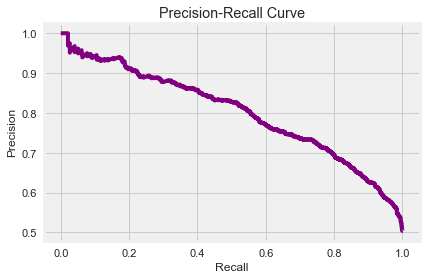

None




 AUC is 

 #########################################

 0.7341 

 #########################################



<AxesSubplot:>

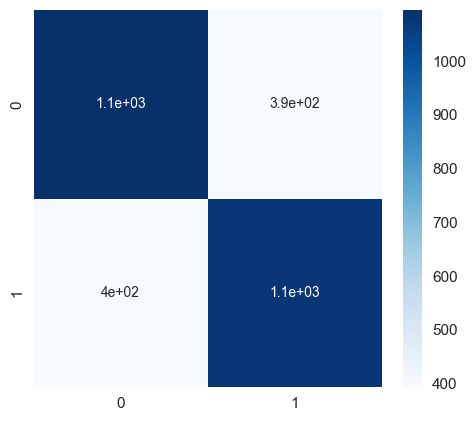

<AxesSubplot:>

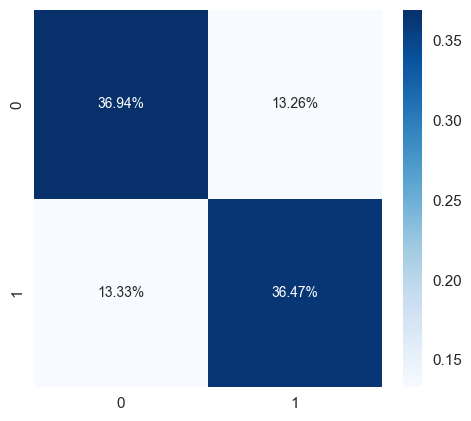

In [38]:
evalute_model_full_evaluation(data_object_PCA.y_test, logistic_regression_PCA_test_predictions,
                              logistic_regression_model_PCA_test_soft_predictions)

In [39]:
SVM_model_PCA = SVC(probability=True)
SVM_model_PCA.fit(data_object_PCA.x_train, data_object_PCA.y_train)

SVM_model_PCA_train_predictions = SVM_model_PCA.predict(data_object_PCA.x_train)
SVM_model_PCA_test_predictions = SVM_model_PCA.predict(data_object_PCA.x_test)

In [40]:
SVM_model_PCA_test_soft_predictions = SVM_model_PCA.predict_proba(data_object_PCA.x_test)
SVM_model_PCA_test_soft_predictions = \
preprocessing_object_PCA.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    SVM_model_PCA_test_soft_predictions)

Accuracy Score is  0.7206477732793523
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.72      0.73      0.72      1488
           1       0.72      0.71      0.72      1476

    accuracy                           0.72      2964
   macro avg       0.72      0.72      0.72      2964
weighted avg       0.72      0.72      0.72      2964



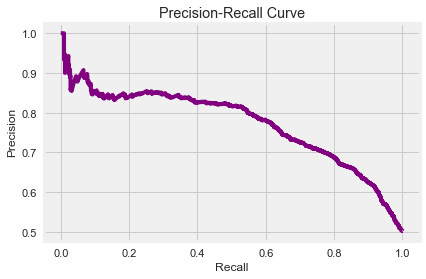

None




 AUC is 

 #########################################

 0.7206 

 #########################################



<AxesSubplot:>

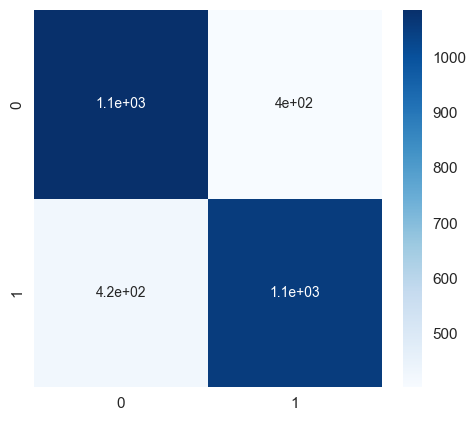

<AxesSubplot:>

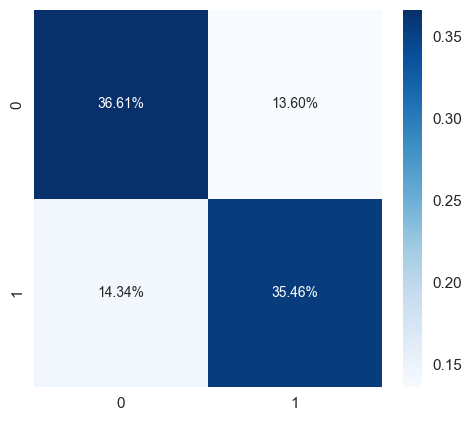

In [41]:
evalute_model_full_evaluation(data_object_PCA.y_test, SVM_model_PCA_test_predictions,
                              SVM_model_PCA_test_soft_predictions)

In [42]:
random_forest_model_PCA = RandomForestClassifier(n_estimators = 1_000, max_depth=20, random_state=0)
random_forest_model_PCA.fit(data_object_PCA.x_train, data_object_PCA.y_train)

random_forest_model_PCA_train_predictions = random_forest_model_PCA.predict(data_object_PCA.x_train)
random_forest_model_PCA_test_predictions = random_forest_model_PCA.predict(data_object_PCA.x_test)

In [43]:
random_forest_model_PCA_test_soft_predictions = random_forest_model_PCA.predict_proba(data_object_PCA.x_test)
random_forest_model_PCA_test_soft_predictions = \
preprocessing_object_PCA.convert_double_valued_binary_probability_array_to_signle_valued_binary_probability_array(
    random_forest_model_PCA_test_soft_predictions)

Accuracy Score is  0.7108636977058029
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.71      0.72      0.71      1488
           1       0.71      0.70      0.71      1476

    accuracy                           0.71      2964
   macro avg       0.71      0.71      0.71      2964
weighted avg       0.71      0.71      0.71      2964



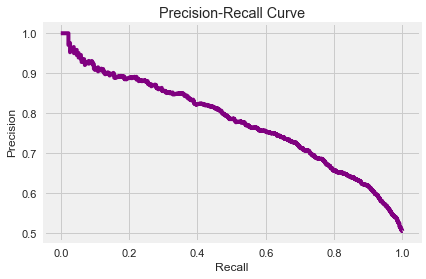

None




 AUC is 

 #########################################

 0.7108 

 #########################################



<AxesSubplot:>

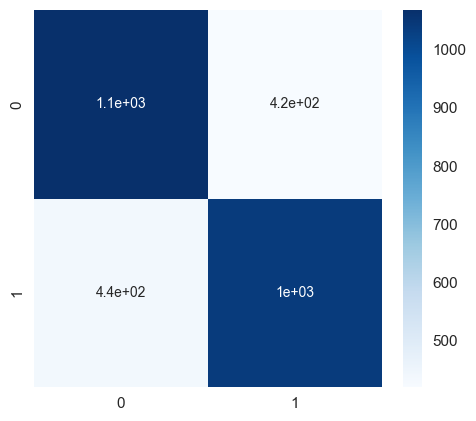

<AxesSubplot:>

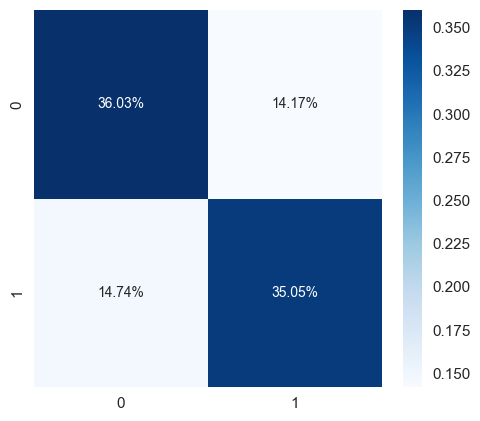

In [44]:
evalute_model_full_evaluation(data_object_PCA.y_test, random_forest_model_PCA_test_predictions,
                              random_forest_model_PCA_test_soft_predictions)

In [45]:
#================================================ 
class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        keys = list(logs.keys())
        if(float(logs.get('acc')) >= 0.73 and float(logs.get('val_acc')) >= 0.73):
            print('')
            print('')
            print('Training is stopped because ')
            print('the accuracy is ', float(logs.get('acc')) , 'and the val_acc is ', float(logs.get('val_acc')) )
            self.model.stop_training = True

In [46]:
deep_model_PCA = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(data_object_PCA.x_train.shape[1:])),
    tf.keras.layers.Dense(100, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.005)),
    tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.005)),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])
deep_model_PCA.summary()
deep_model_PCA.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['acc'])  
hist = deep_model_PCA.fit(data_object_PCA.x_train, data_object_PCA.y_train, epochs=100, batch_size=8,
                      validation_data=(data_object_PCA.x_test, data_object_PCA.y_test), callbacks=[CustomCallback()])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 10)                0         
                                                                 
 dense_3 (Dense)             (None, 100)               1100      
                                                                 
 dense_4 (Dense)             (None, 64)                6464      
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 7,629
Trainable params: 7,629
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
865/865 [==============================] - 6s 6ms/step - loss: 0.6593 - acc: 0.7192 - val_loss: 0.5778 - val_acc: 0.7186
Epoch 2/100
865/865 [==============================

In [47]:
deep_model_PCA_train_predictions = deep_model_PCA.predict(data_object_PCA.x_train)[:, 0]
deep_model_PCA_hard_train_predictions = \
        preprocessing_object_PCA.convert_single_valued_bibnary_array_probabilities_to_hard_value(deep_model_PCA_train_predictions)


deep_model_PCA_test_predictions = deep_model_PCA.predict(data_object_PCA.x_test)[:, 0]
deep_model_PCA_hard_test_predictions = \
        preprocessing_object_PCA.convert_single_valued_bibnary_array_probabilities_to_hard_value(deep_model_PCA_test_predictions)

Accuracy Score is  0.7331309041835358
 
 
 
 Classification report 
---------
              precision    recall  f1-score   support

           0       0.73      0.73      0.73      1488
           1       0.73      0.73      0.73      1476

    accuracy                           0.73      2964
   macro avg       0.73      0.73      0.73      2964
weighted avg       0.73      0.73      0.73      2964



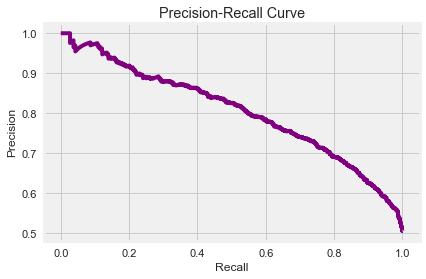

None




 AUC is 

 #########################################

 0.7331 

 #########################################



<AxesSubplot:>

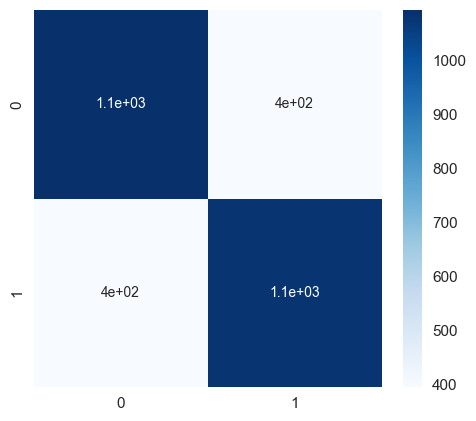

<AxesSubplot:>

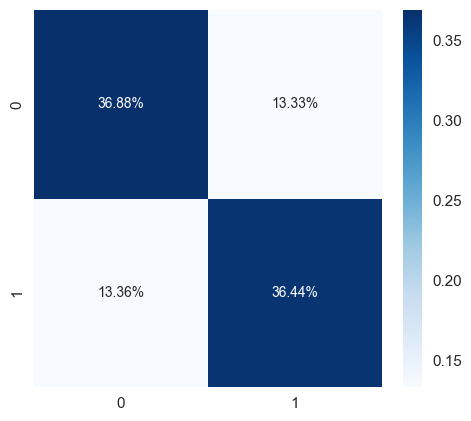

In [48]:
evalute_model_full_evaluation(data_object_PCA.y_test, deep_model_PCA_hard_test_predictions,
                              deep_model_PCA_test_predictions)